In [1]:
# importing libraries
import torch
import glob as glob
import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
from tqdm import tqdm
from PIL import Image
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from torchvision.utils import save_image
plt.style.use('ggplot')
import math


In [2]:


# defining psnr
def psnr(label, outputs, max_val=1.):
    """
    Compute Peak Signal to Noise Ratio (the higher the better).
    PSNR = 20 * log10(MAXp) - 10 * log10(MSE)."""
    
    label = label.cpu().detach().numpy()
    outputs = outputs.cpu().detach().numpy()
    diff = outputs - label
    rmse = math.sqrt(np.mean((diff) ** 2))
    if rmse == 0:
        return 100
    else:
        PSNR = 20 * math.log10(max_val / rmse)
        return PSNR
    


In [3]:
# implementing the SRCNN model, based on the research paper.
# particularly, the 9-1-5 architecture.
class SRCNN(nn.Module):
    def __init__(self):
        super(SRCNN, self).__init__()
        self.conv1 = nn.Conv2d(
            3, 64, kernel_size=9, stride=(1, 1), padding=(2, 2)
        )
        self.conv2 = nn.Conv2d(
            64, 32, kernel_size=1, stride=(1, 1), padding=(2, 2)
        )
        self.conv3 = nn.Conv2d(
            32, 3, kernel_size=5, stride=(1, 1), padding=(2, 2)
        )
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = self.conv3(x)
        return x

def validate(model, dataloader, device):
    model.eval()
    running_loss = 0.0
    running_psnr = 0.0
    with torch.no_grad():
        for num, data in tqdm(enumerate(dataloader), total=len(dataloader)):
            image_data = data[0].to(device)
            label = data[1].to(device)
            outputs = model(image_data)
            save_image(
                outputs, 
                f"../validation/val_sr_{num}.png"
            )
            # Calculate batch psnr (once every `batch_size` iterations).
            batch_psnr = psnr(label, outputs)
            running_psnr += batch_psnr

    final_loss = running_loss/len(dataloader.dataset)
    final_psnr = running_psnr/len(dataloader)
    return final_loss, final_psnr



In [4]:


# The SRCNN dataset module.
# custom dataset .
class SRCNNDataset(Dataset):
    def __init__(self, image_paths):
        self.all_image_paths = glob.glob(f"{image_paths}/*")

    def __len__(self):
        return (len(self.all_image_paths))

    def __getitem__(self, index):
        # The high resolution ground truth label.
        label = Image.open(self.all_image_paths[index]).convert('RGB')
        w, h = label.size[:]
        # Convert to 2x bicubic.
        low_res_img = label.resize((int(w*0.5), int(h*0.5)), Image.BICUBIC)
        # The low resolution input image.
        image = low_res_img.resize((w, h), Image.BICUBIC)

        # Display the images.
        plt.figure(figsize=(12, 9))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(label)
        plt.axis('off')
        plt.show()

        image = np.array(image, dtype=np.float32)
        label = np.array(label, dtype=np.float32)

        image /= 255.
        label /= 255.

        image = image.transpose([2, 0, 1])
        label = label.transpose([2, 0, 1])

        return (
            torch.tensor(image, dtype=torch.float),
            torch.tensor(label, dtype=torch.float)
        )


In [5]:

# Prepare the datasets.
def give_datasets(image_paths):
    dataset_test = SRCNNDataset(image_paths)
    return dataset_test

# Prepare the data loaders
def give_dataloaders(dataset_test):
    test_loader = DataLoader(
        dataset_test, 
        batch_size=1,
        shuffle=False
    )
    return test_loader



/tmp/ipykernel_27019/1508478939.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('../outputs/model.pth'))
  0%|          | 0/5 [00:00<?, 

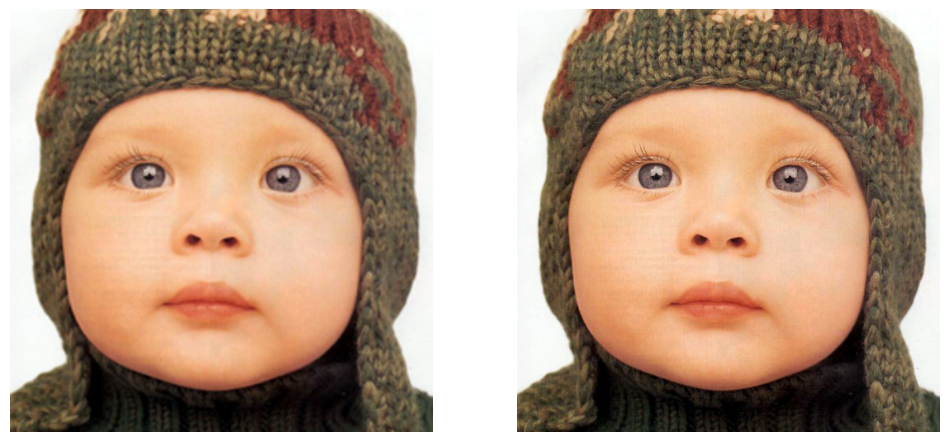

 20%|██        | 1/5 [00:00<00:03,  1.01it/s]

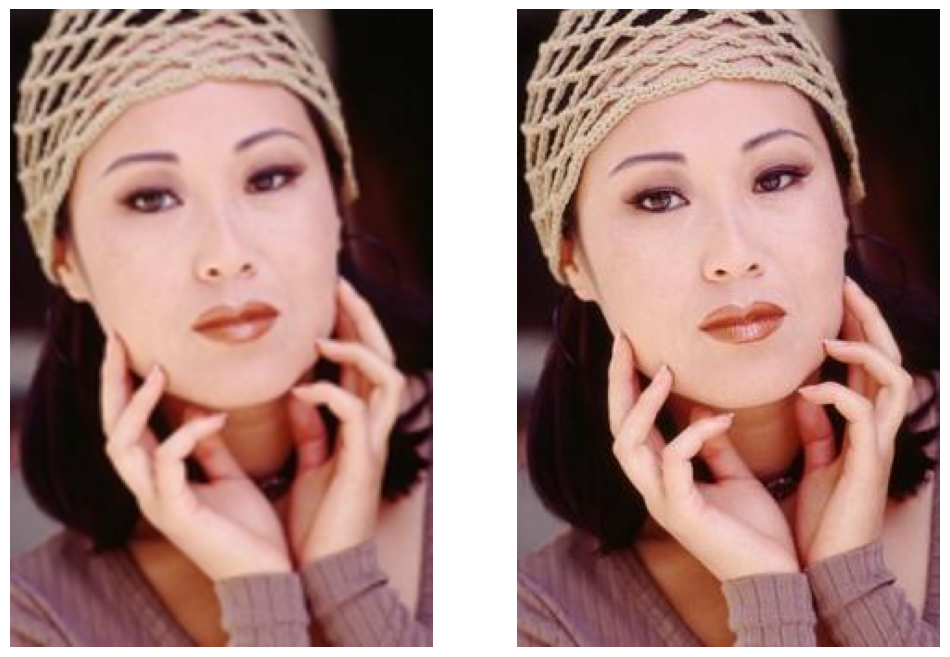

 40%|████      | 2/5 [00:01<00:02,  1.16it/s]

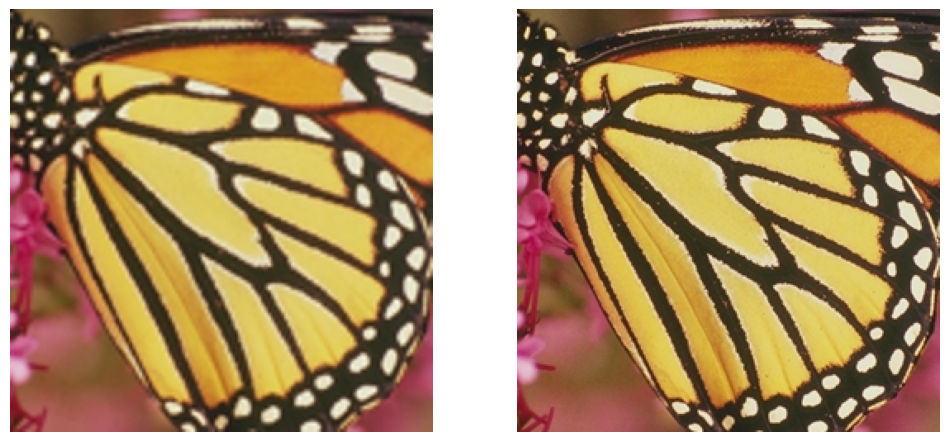

 60%|██████    | 3/5 [00:02<00:01,  1.26it/s]

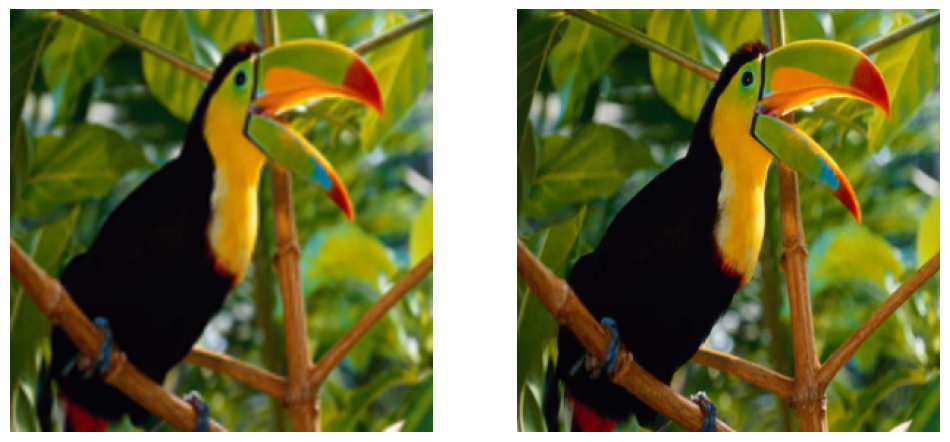

 80%|████████  | 4/5 [00:03<00:00,  1.42it/s]

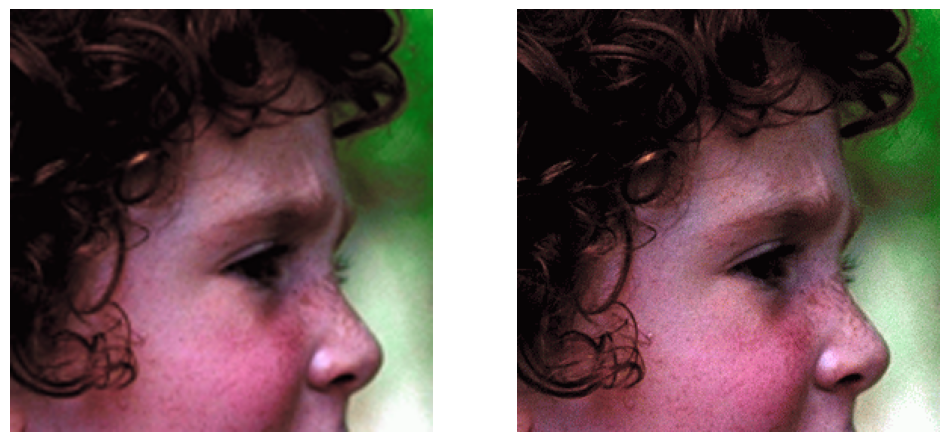

100%|██████████| 5/5 [00:03<00:00,  1.35it/s]


Test PSNR on Set5: 31.978


  0%|          | 0/14 [00:00<?, ?it/s]

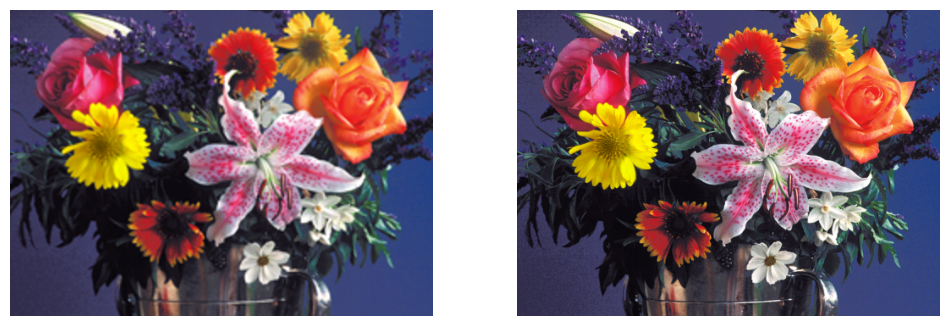

  7%|▋         | 1/14 [00:00<00:11,  1.11it/s]

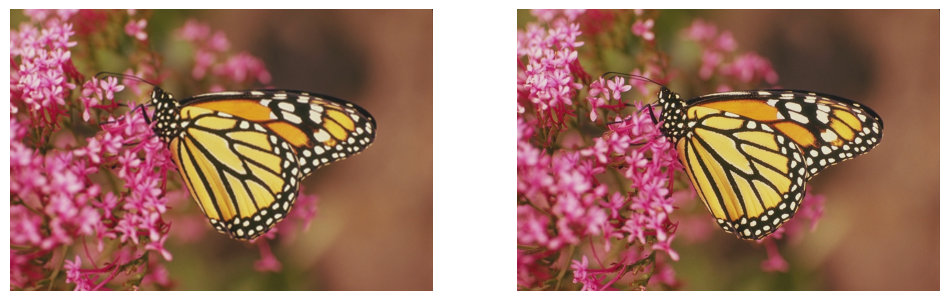

 14%|█▍        | 2/14 [00:02<00:13,  1.12s/it]

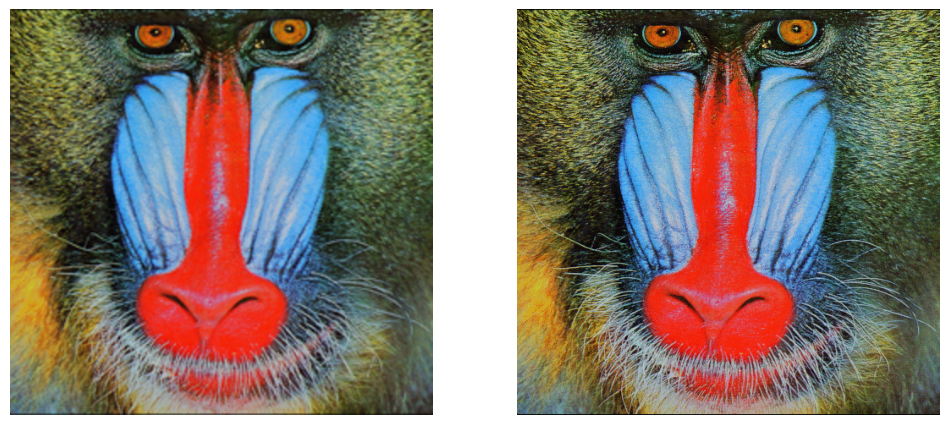

 21%|██▏       | 3/14 [00:03<00:12,  1.16s/it]

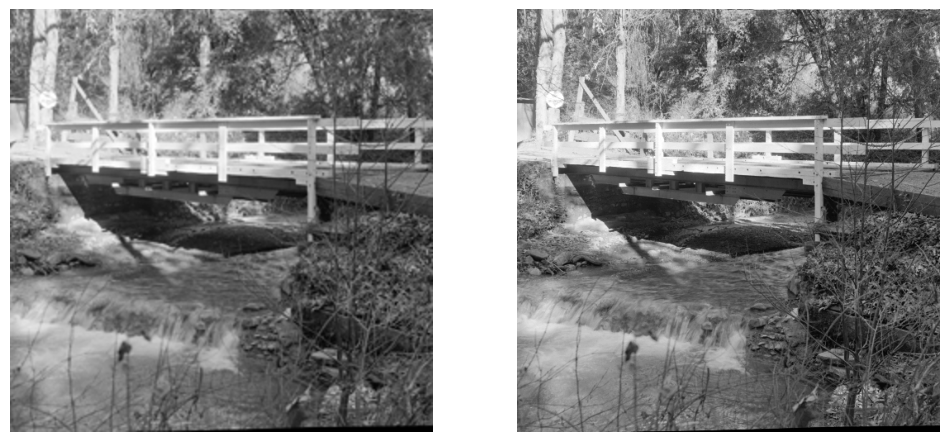

 29%|██▊       | 4/14 [00:04<00:11,  1.15s/it]

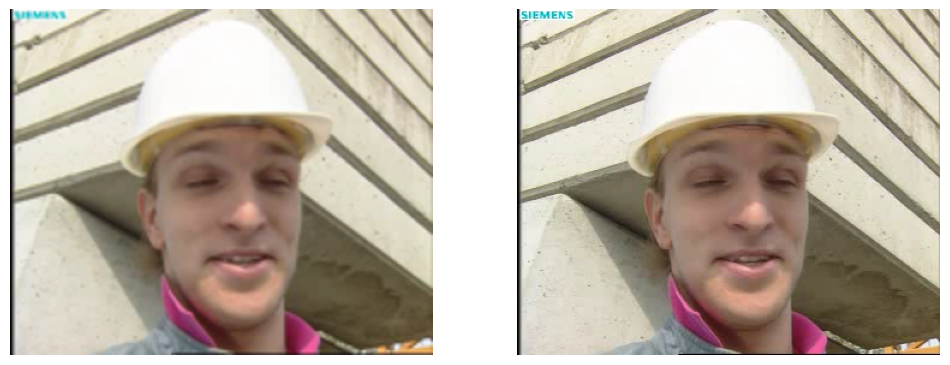

 36%|███▌      | 5/14 [00:05<00:08,  1.02it/s]

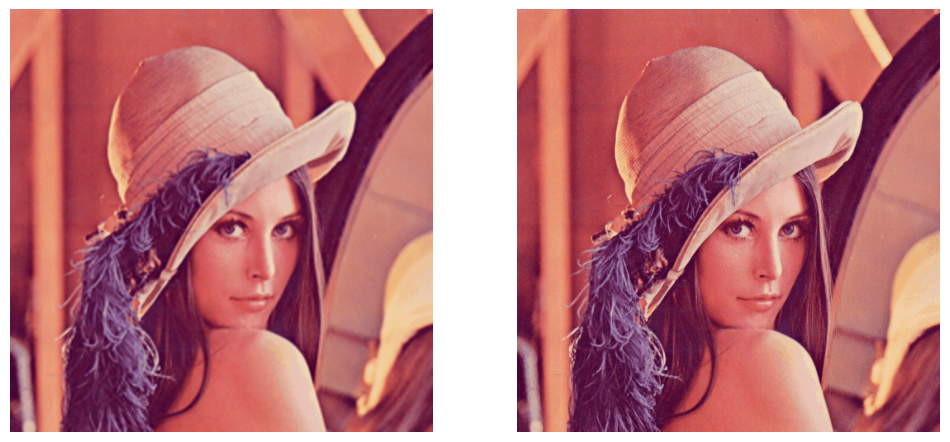

 43%|████▎     | 6/14 [00:06<00:08,  1.07s/it]

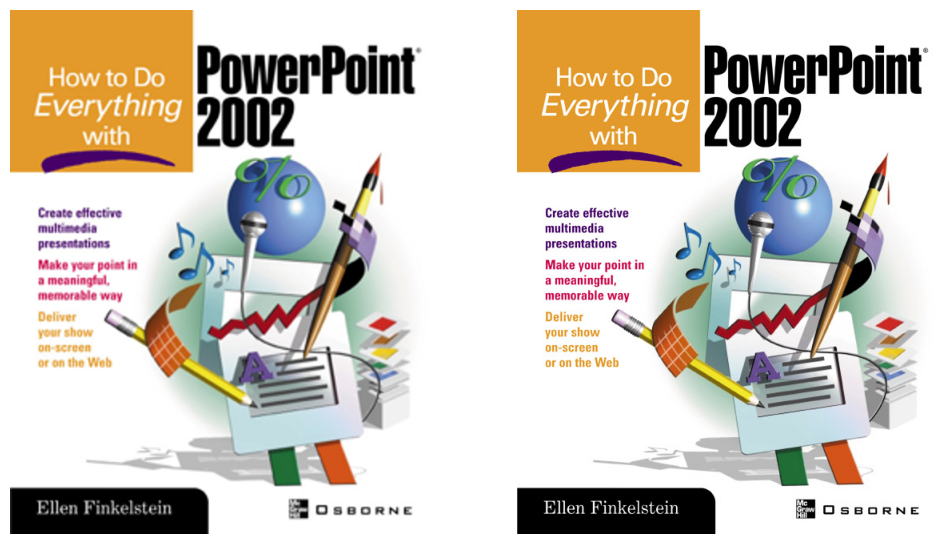

 50%|█████     | 7/14 [00:07<00:07,  1.10s/it]

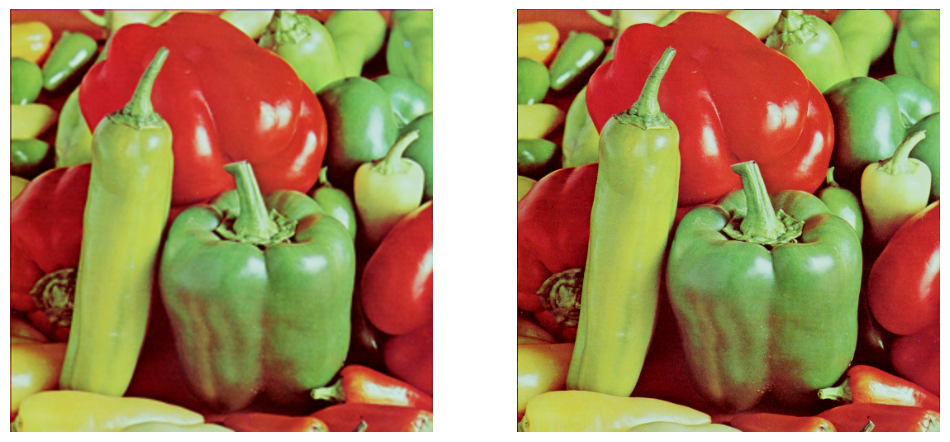

 57%|█████▋    | 8/14 [00:08<00:07,  1.19s/it]

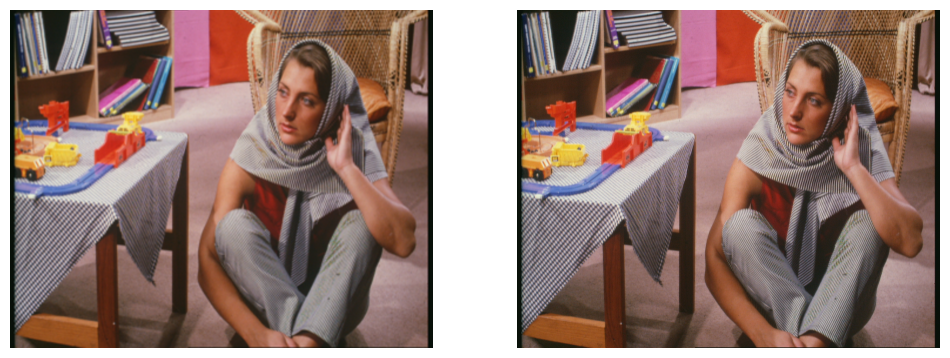

 64%|██████▍   | 9/14 [00:10<00:06,  1.38s/it]

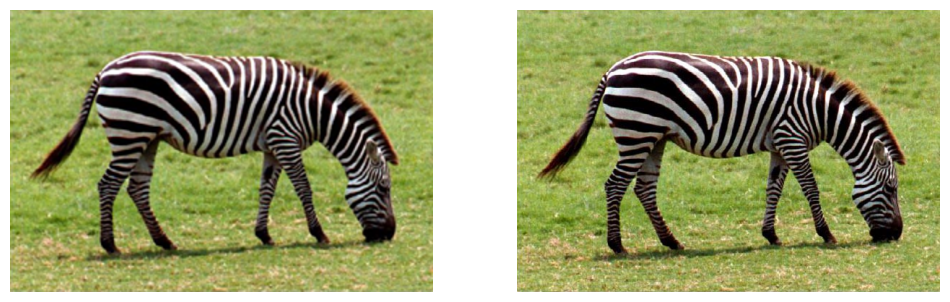

 71%|███████▏  | 10/14 [00:12<00:05,  1.39s/it]

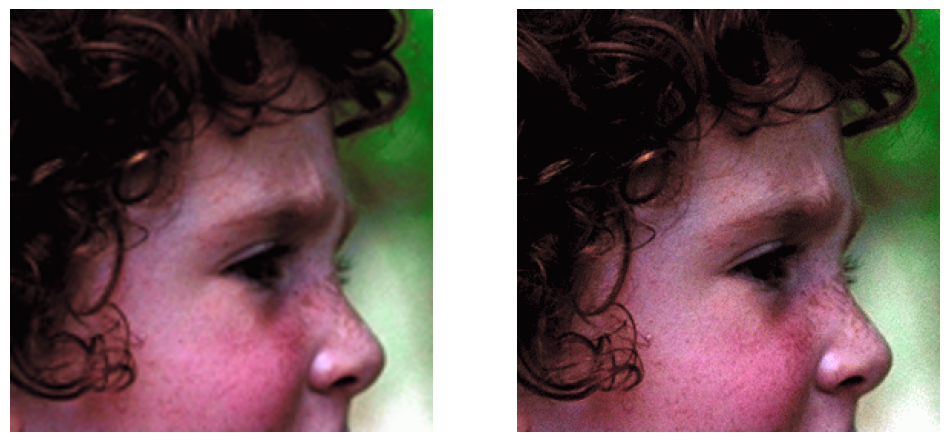

 79%|███████▊  | 11/14 [00:13<00:03,  1.24s/it]

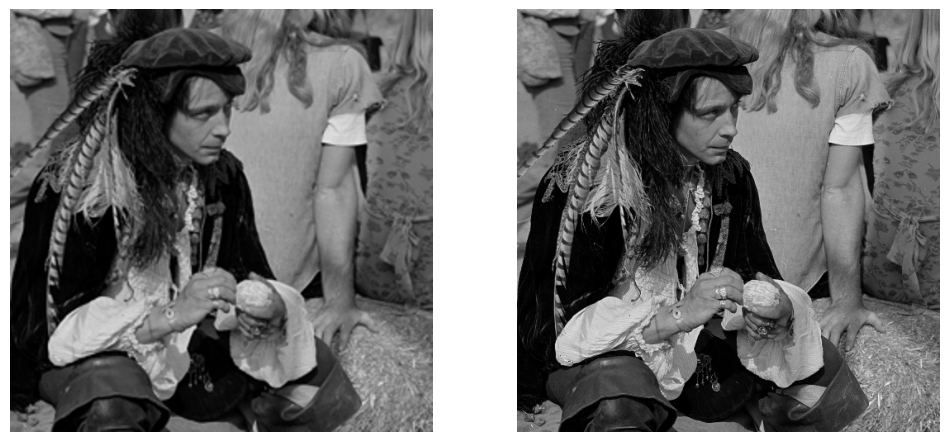

 86%|████████▌ | 12/14 [00:14<00:02,  1.19s/it]

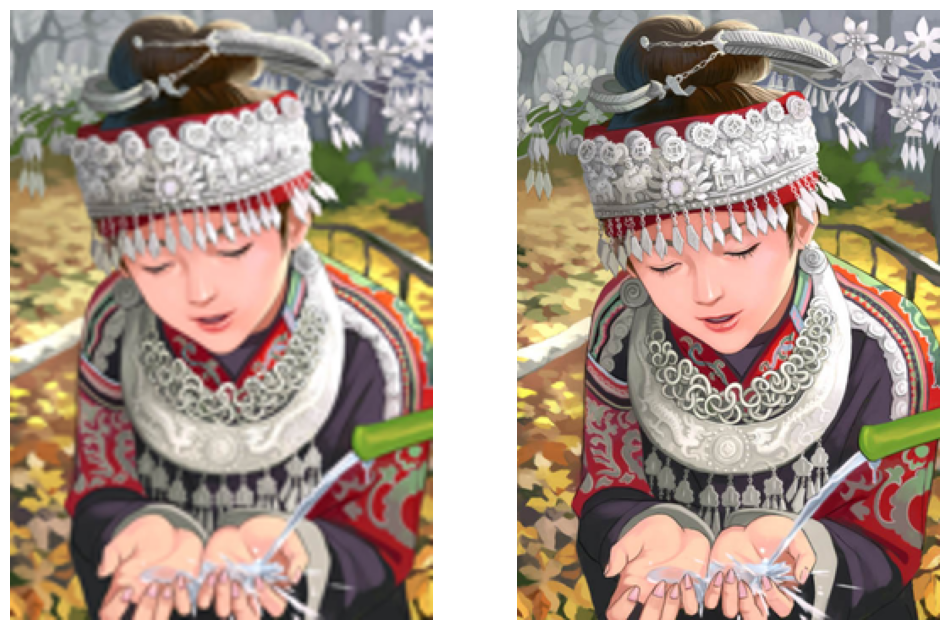

 93%|█████████▎| 13/14 [00:15<00:01,  1.11s/it]

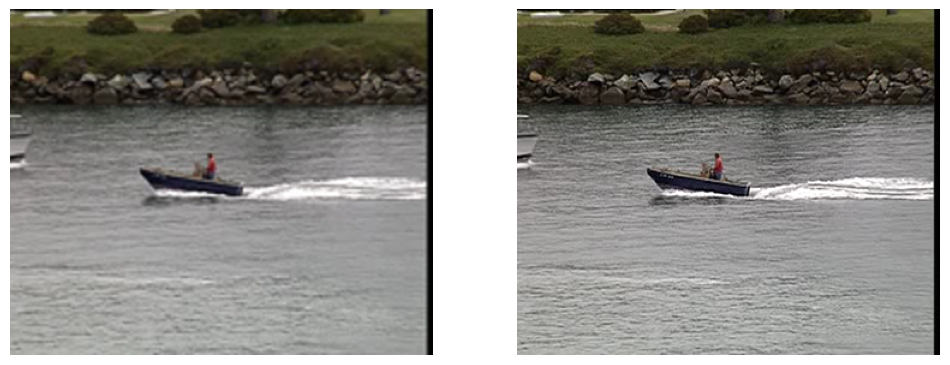

100%|██████████| 14/14 [00:15<00:00,  1.14s/it]

Test PSNR on Set14: 28.325


In [8]:


# Load the model.
model = SRCNN().to(device)
model.load_state_dict(torch.load('../outputs/model.pth'))
# preloaded model file.
# we are testing on Set5 and Set14 datasets.
data_paths = [
    ['../input/Set5/original', 'Set5'],
    ['../input/Set14/original', 'Set14']
]

for data_path in data_paths:
    dataset_test = give_datasets(data_path[0])
    test_loader = give_dataloaders(dataset_test)

    _, test_psnr = validate(model, test_loader, device)
    print(f"Test PSNR on {data_path[1]}: {test_psnr:.3f}")

/tmp/ipykernel_27019/4285529779.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('../outputs/model.pth'))
  0%|          | 0/7 [00:00<?, 

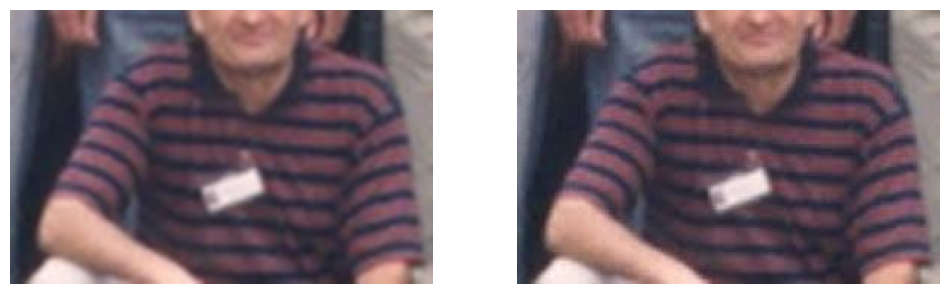

 14%|█▍        | 1/7 [00:00<00:02,  2.51it/s]

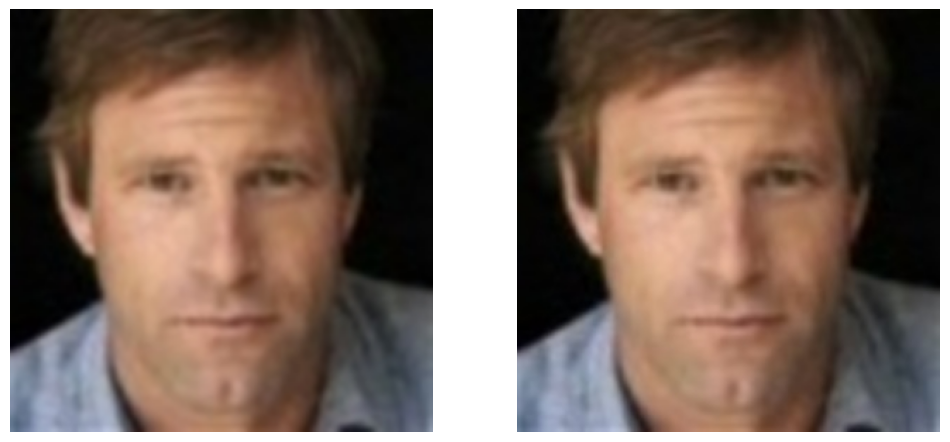

 29%|██▊       | 2/7 [00:00<00:02,  2.13it/s]

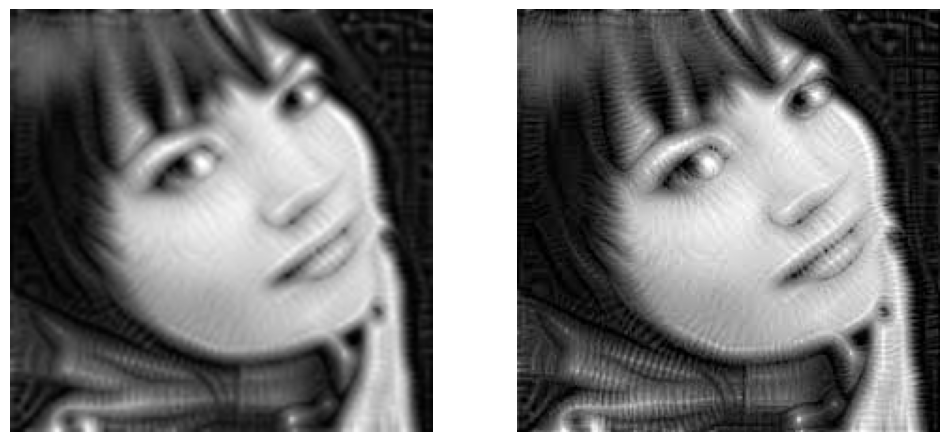

 43%|████▎     | 3/7 [00:01<00:01,  2.25it/s]

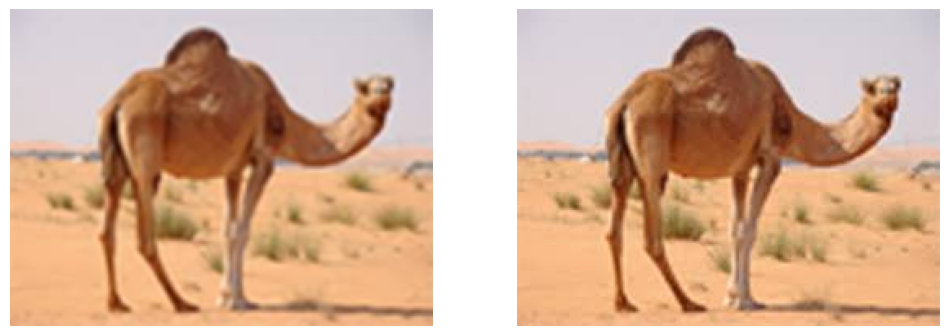

 57%|█████▋    | 4/7 [00:01<00:01,  2.60it/s]

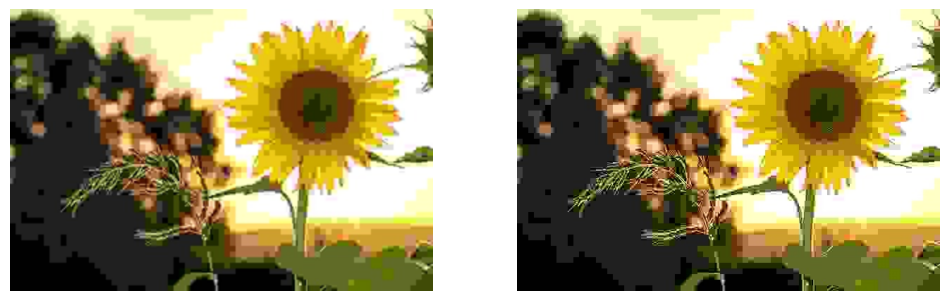

 71%|███████▏  | 5/7 [00:02<00:00,  2.25it/s]

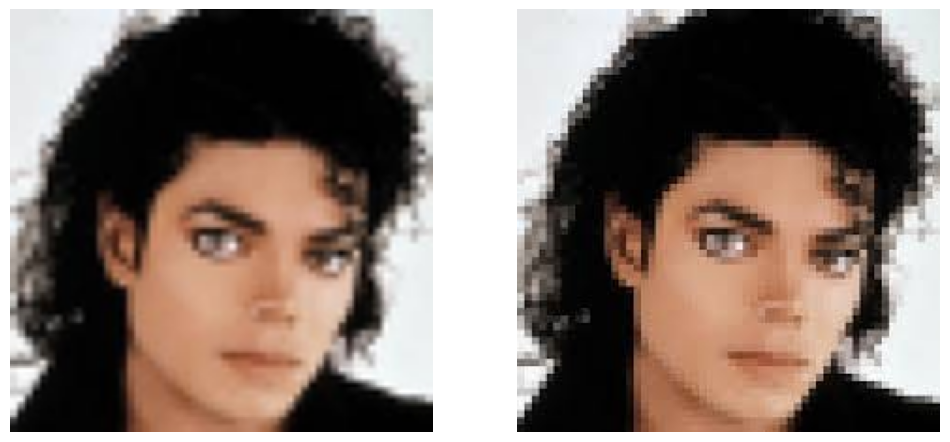

 86%|████████▌ | 6/7 [00:02<00:00,  2.24it/s]

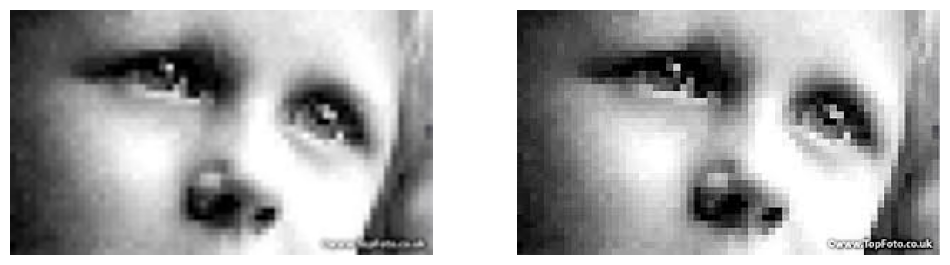

100%|██████████| 7/7 [00:03<00:00,  2.31it/s]

Test PSNR on Some more images: 34.461


In [11]:
model = SRCNN().to(device)
model.load_state_dict(torch.load('../outputs/model.pth'))
# testing some random images taken from the internet.
data_paths = [
    ['../random', 'Some more images']
]

for data_path in data_paths:
    dataset_test = give_datasets(data_path[0])
    test_loader = give_dataloaders(dataset_test)

    _, test_psnr = validate(model, test_loader, device)
    print(f"Test PSNR on {data_path[1]}: {test_psnr:.3f}")